# VNA measurements of lines.
https://github.com/QCoDeS/Qcodes/blob/master/docs/examples/driver_examples/Qcodes%20example%20with%20Rohde%20Schwarz%20ZNB.ipynb 

In [1]:
import os, sys
import matplotlib.pyplot as plt
import qcodes as qc
import numpy as np
from datetime import datetime, timedelta


#import instrument
import qcodes.instrument_drivers.rohde_schwarz.ZNB as ZNB

from qcodes.dataset.measurements import Measurement
from qcodes.dataset.plotting import plot_by_id, load_by_id
from qcodes.dataset.data_export import get_data_by_id


#Analysis
#from characterizations.characterizations import resonators as res
#from characterizations.characterizations.fitter import fit

In [2]:
%matplotlib notebook

In [3]:
#initialize database
import datetime
date = '20190504'
dataset_name = 'ABS_W1_5_1_1'
qc.config["core"]["db_location"] = datetime.date.today().strftime(r'D:\OneDrive\BF3\Data\\'+date+'_'+dataset_name+'.db')
# automatically uses a different DB file for each month
qc.dataset.database.initialise_database()
qc.config.core.db_location


'D:\\OneDrive\\BF3\\Data\\\\20190504_ABS_W1_5_1_1.db'

In [4]:
def get_f0s_from_data(data_id):
    data = load_by_id(data_id)
    freqs = np.squeeze(np.array(data.get_data('frequency')))
    mag = np.squeeze(np.array(data.get_data('magnitude_dB')))
    amp = np.squeeze(np.array(data.get_data('mag')))
    phase = np.squeeze(np.array(data.get_data('phase')))
    #gates = np.squeeze(np.array(data.get_data('V_cut_A')))

    f0s = freqs[1,np.argmin(mag[:,:],axis=1)]
    return f0s

def unpack_data(data_id, col_names = ['frequency', 'mag', 'phase', 'magnitude_dB']):
    """ 
    Just loads the data from database to numpy arrays
    specifying columns with the list arguments
    """
    data = load_by_id(data_id)
    data_dict = {}
    for col_name in col_names:
        data_dict[col_name] = np.squeeze(np.array(data.get_data(col_name))) #somehow they added empty dimensions in qcodes. or maybe that is just my bad saving 
    
    return data_dict

def plot_readout_point_from_sweep(plot_id, f_readout = 4.84700e9):
    """
    plots readout point in mag vs phase resonance sweep. 
    """
    dat = unpack_data(plot_id, col_names=['frequency', 'phase', 'magnitude_dB', 'magnitude_raw'])
    plt.figure()
    plt.plot(dat['frequency'],dat['magnitude_raw'], '--')
    plt.ylabel('mag')
    plt.twinx()
    plt.plot(dat['frequency'],dat['phase'], '--g')
    plt.axvline(x=f_readout,color='r')
    plt.title('Readout point sweep for sweep #%d, id=#%d' % (plot_id+1, plot_id))
    plt.ylabel('phase')

In [753]:
data = load_by_id(90)

snap = data.snapshot

In [757]:
snap['station']['instruments']['MDAC']

{'__class__': 'MDAC.MDAC',
 'address': 'ASRL4::INSTR',
 'functions': {'sync': {}},
 'name': 'MDAC',
 'parameters': {'IDN': {'__class__': 'qcodes.instrument.parameter.Parameter',
   'full_name': 'MDAC_IDN',
   'instrument': 'MDAC.MDAC',
   'instrument_name': 'MDAC',
   'inter_delay': 0,
   'label': 'IDN',
   'name': 'IDN',
   'post_delay': 0,
   'raw_value': {'firmware': '1.4',
    'model': 'MDAC',
    'serial': '0x32353532353551040028003E',
    'vendor': 'QNL Sydney'},
   'ts': '2019-05-06 15:06:50',
   'unit': '',
   'vals': '<Anything>',
   'value': {'firmware': '1.4',
    'model': 'MDAC',
    'serial': '0x32353532353551040028003E',
    'vendor': 'QNL Sydney'}},
  'arb_engine': {'__class__': 'qcodes.instrument.parameter.Parameter',
   'full_name': 'MDAC_arb_engine',
   'instrument': 'MDAC.MDAC',
   'instrument_name': 'MDAC',
   'inter_delay': 0,
   'label': 'MDAC AWG engine status',
   'name': 'arb_engine',
   'post_delay': 0,
   'raw_value': 'ON',
   'ts': '2019-05-06 15:06:50',
   

In [85]:
d = unpack_data(54, col_names=['frequency','magnitude_dB'])

<IPython.core.display.Javascript object>


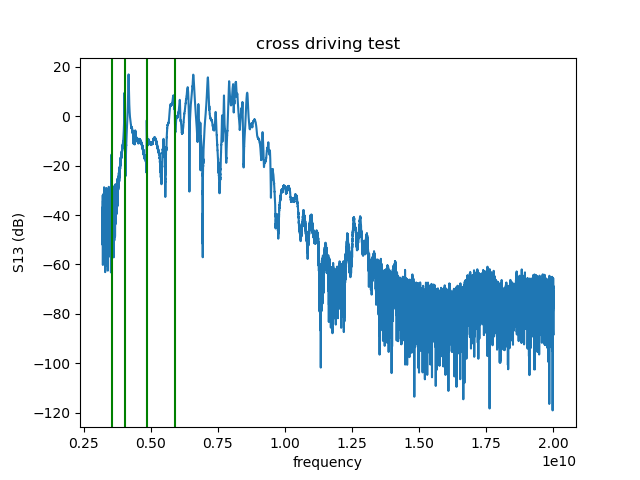

In [86]:
plt.figure()
plt.plot(d['frequency'], d['magnitude_dB'])
plt.title('cross driving test')
plt.xlabel('frequency')
plt.ylabel('S13 (dB)')
freqs = [3.535e9, 4.020e9, 4.847e9, 5.889e9]
#freqs = [5.889e9]

for f in freqs:
    plt.axvline(x=f,color='g')

<IPython.core.display.Javascript object>


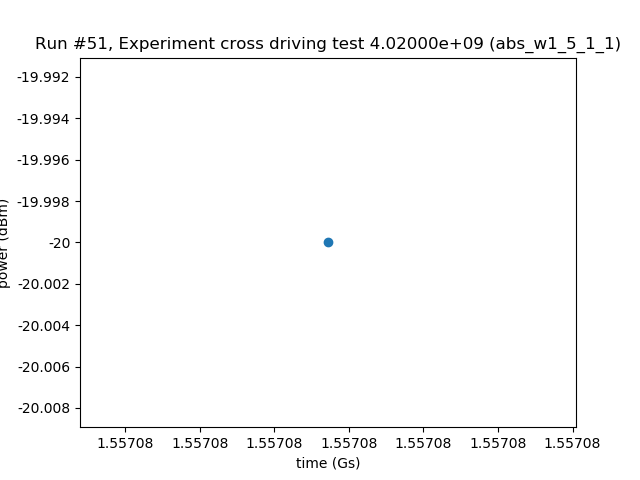

<IPython.core.display.Javascript object>


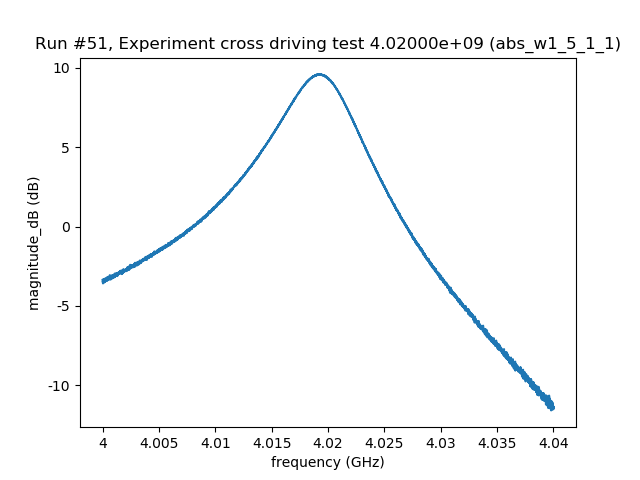

<IPython.core.display.Javascript object>


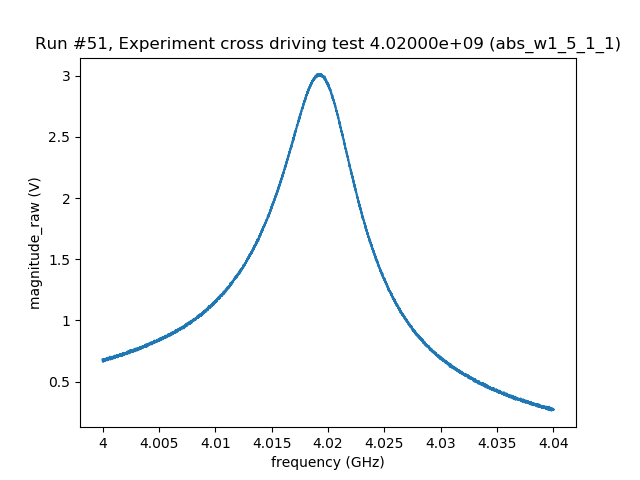

<IPython.core.display.Javascript object>


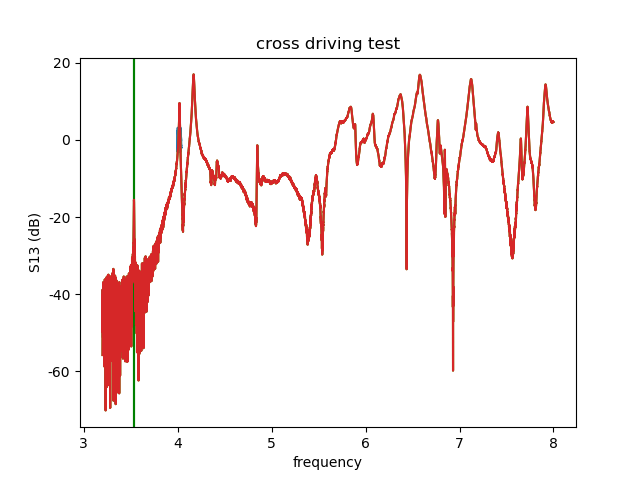

([<matplotlib.axes._subplots.AxesSubplot at 0x257c0e30160>,
 [None, None, None, None])

In [66]:
plot_by_id(51)

<IPython.core.display.Javascript object>


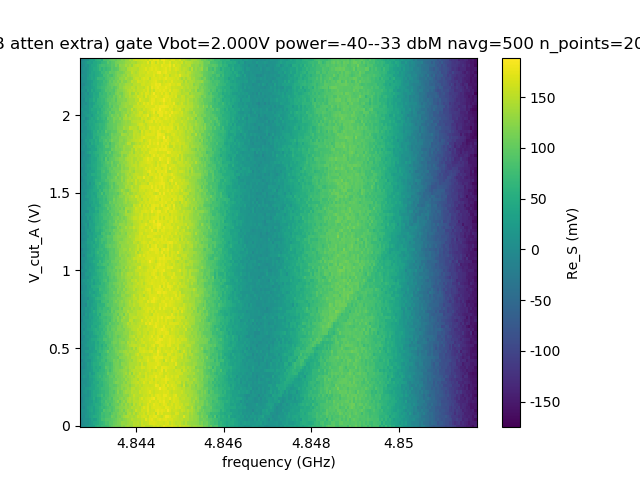

<IPython.core.display.Javascript object>


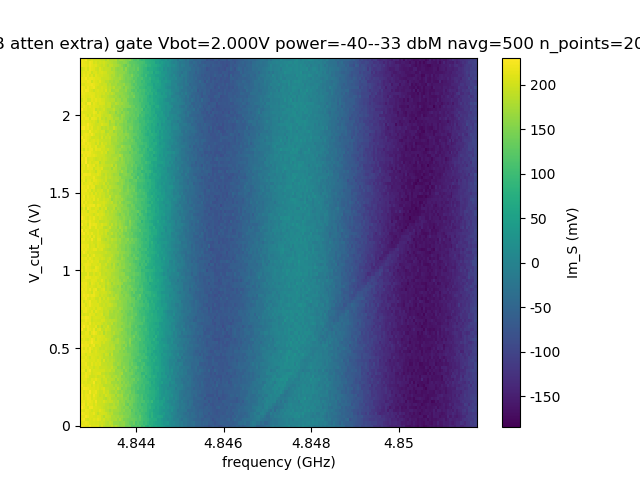

<IPython.core.display.Javascript object>


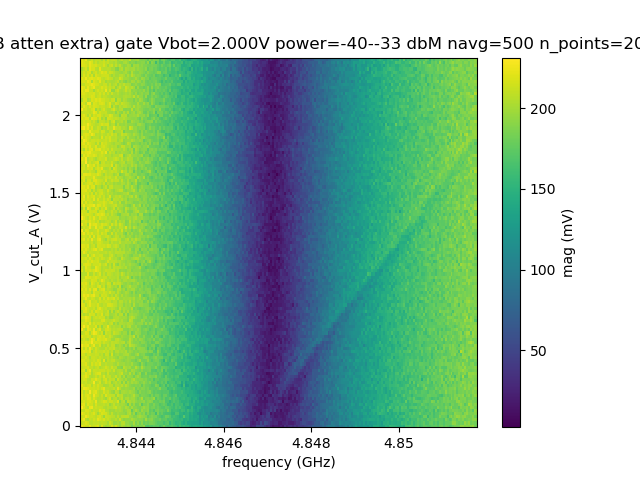

<IPython.core.display.Javascript object>


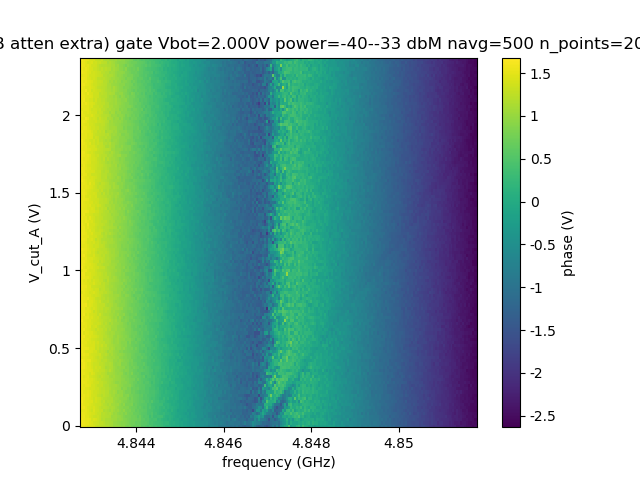

<IPython.core.display.Javascript object>


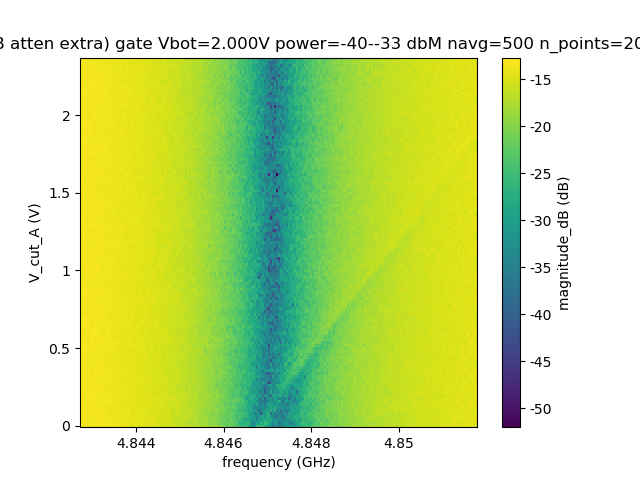

([<matplotlib.axes._subplots.AxesSubplot at 0x257c47d8e10>,
  <matplotlib.colorbar.Colorbar at 0x257c70a1e10>])

In [90]:
plot_by_id(55)

([<matplotlib.axes._subplots.AxesSubplot at 0x25810099240>,
 [None, None, None, None, None])

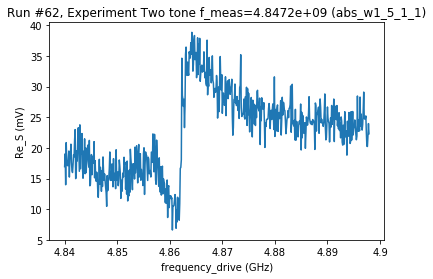

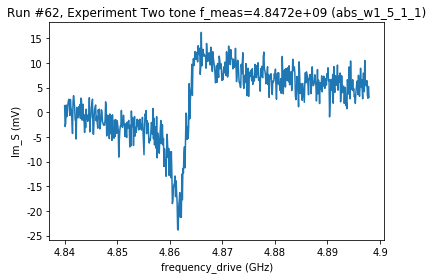

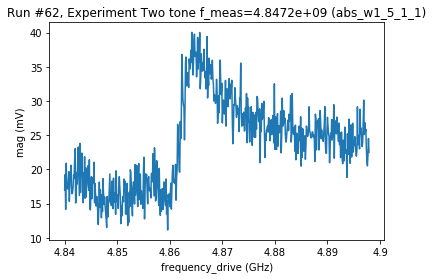

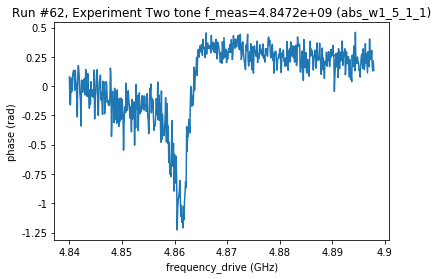

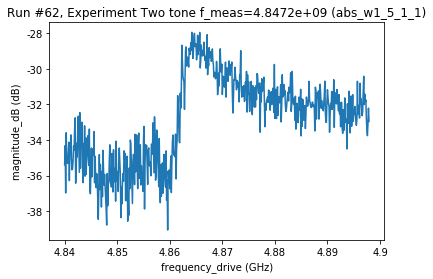

In [184]:
plot_by_id(62)

([<matplotlib.axes._subplots.AxesSubplot at 0x25816ef9f98>,
  <matplotlib.colorbar.Colorbar at 0x258181e0c50>])

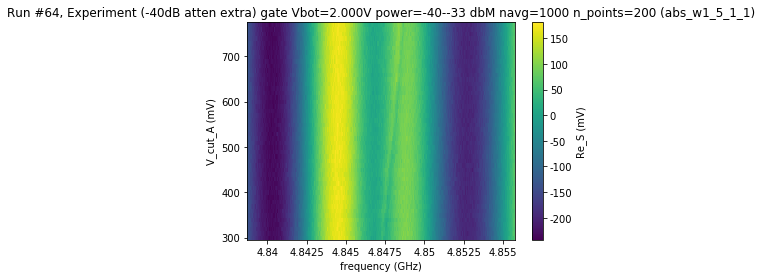

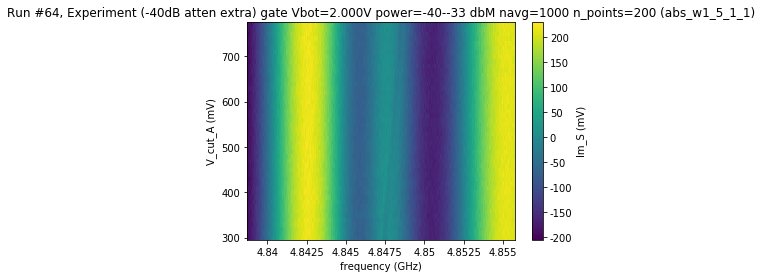

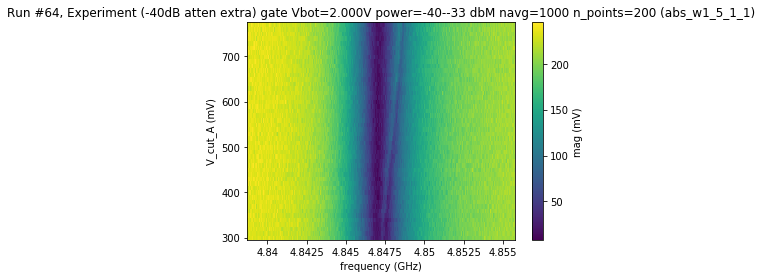

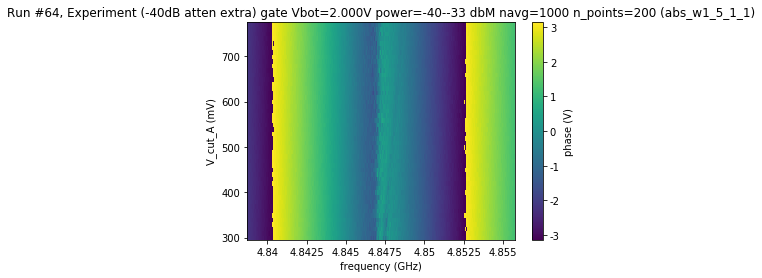

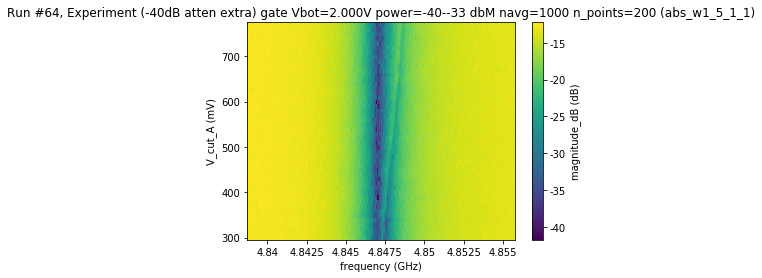

In [194]:
plot_by_id(64)

([<matplotlib.axes._subplots.AxesSubplot at 0x2581e23eac8>,
  <matplotlib.colorbar.Colorbar at 0x2581e4b67f0>])

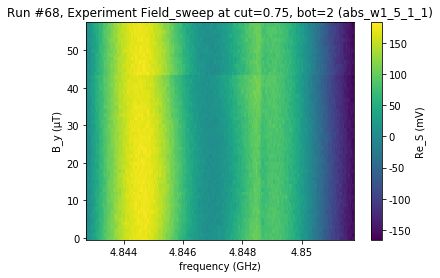

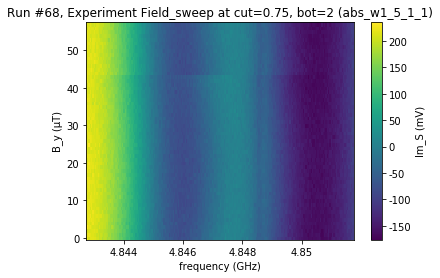

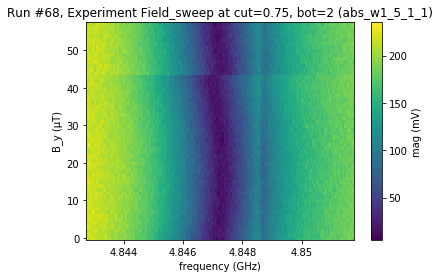

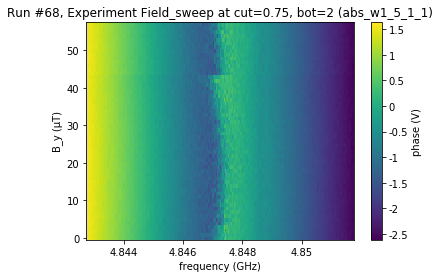

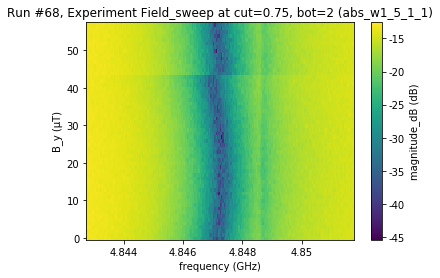

In [208]:
plot_by_id(68)

([<matplotlib.axes._subplots.AxesSubplot at 0x258240104a8>,
  <matplotlib.colorbar.Colorbar at 0x25827c62d68>])

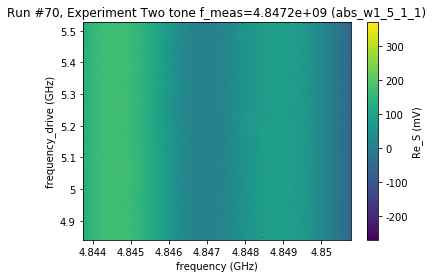

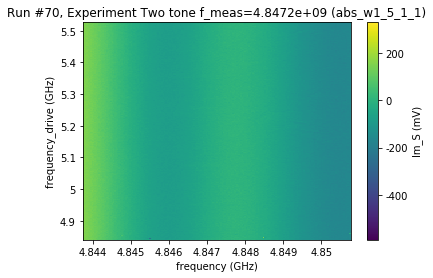

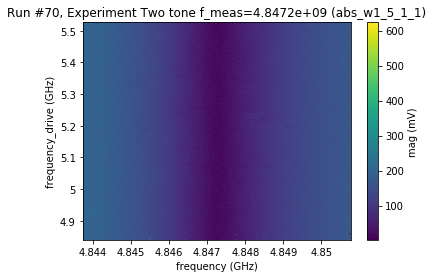

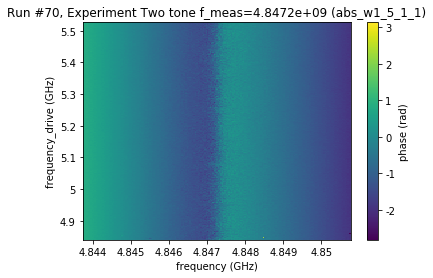

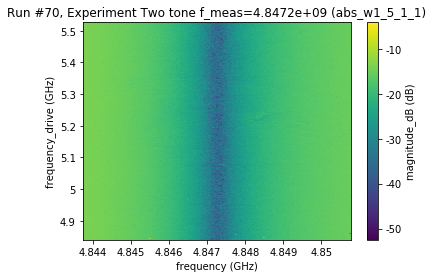

In [219]:

plot_by_id(70)

In [232]:
dat = unpack_data(70,col_names = ['frequency', 'mag', 'phase', 'magnitude_dB', 'frequency_drive'])


[5040000000 5040500000 5041000000 5041500000 5042000000 5042500000
 5043000000 5043500000 5044000000 5044500000 5045000000 5045500000
 5046000000 5046500000 5047000000 5047500000 5048000000 5048500000
 5049000000 5049500000 5050000000 5050500000 5051000000 5051500000
 5052000000 5052500000 5053000000 5053500000 5054000000 5054500000
 5055000000 5055500000 5056000000 5056500000 5057000000 5057500000
 5058000000 5058500000 5059000000 5059500000 5060000000 5060500000
 5061000000 5061500000 5062000000 5062500000 5063000000 5063500000
 5064000000 5064500000 5065000000 5065500000 5066000000 5066500000
 5067000000 5067500000 5068000000 5068500000 5069000000 5069500000
 5070000000 5070500000 5071000000 5071500000 5072000000 5072500000
 5073000000 5073500000 5074000000 5074500000 5075000000 5075500000
 5076000000 5076500000 5077000000 5077500000 5078000000 5078500000
 5079000000 5079500000 5080000000 5080500000 5081000000 5081500000
 5082000000 5082500000 5083000000 5083500000 5084000000 508450

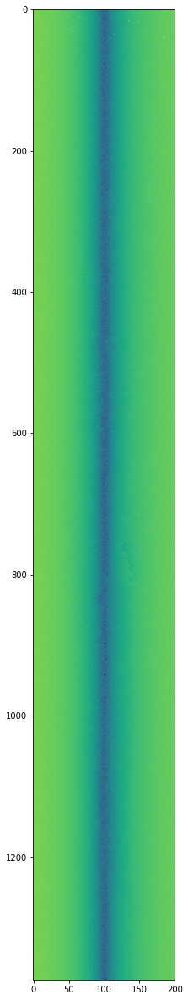

In [235]:
plt.figure(figsize=(3,28))
plt.imshow(dat['magnitude_dB'][:,:])

print(dat['frequency_drive'][400:600])

## 05-06

In [236]:
#initialize database
import datetime
date = '20190506'
dataset_name = 'ABS_W1_5_1_1'
qc.config["core"]["db_location"] = datetime.date.today().strftime(r'D:\OneDrive\BF3\Data\\'+date+'_'+dataset_name+'.db')
# automatically uses a different DB file for each month
qc.dataset.database.initialise_database()
qc.config.core.db_location


'D:\\OneDrive\\BF3\\Data\\\\20190506_ABS_W1_5_1_1.db'

([<matplotlib.axes._subplots.AxesSubplot at 0x2582bb05668>,
  <matplotlib.colorbar.Colorbar at 0x2582bd6b8d0>])

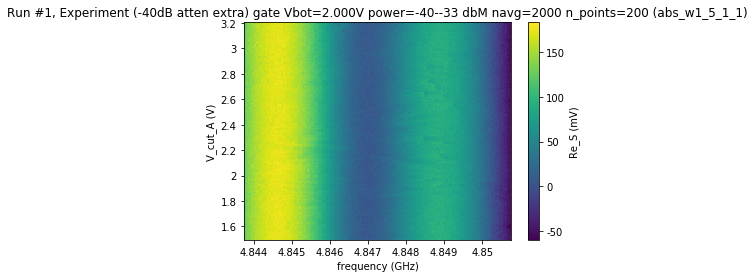

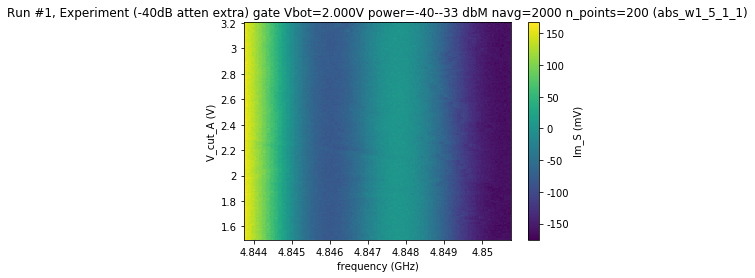

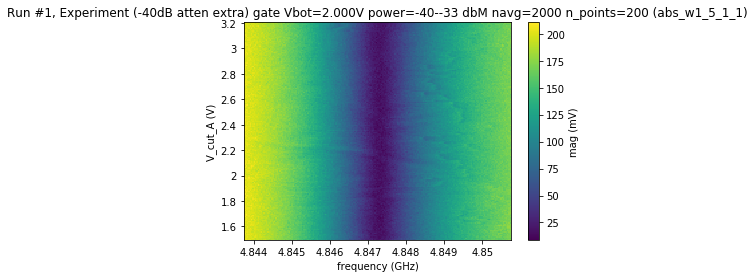

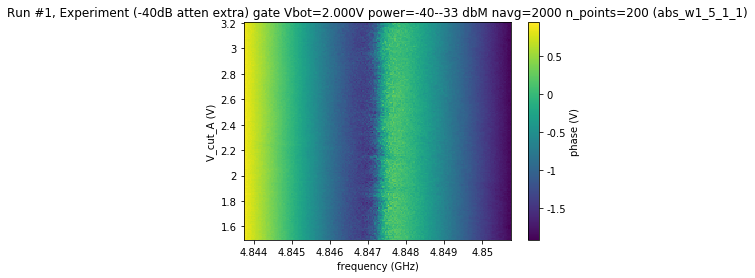

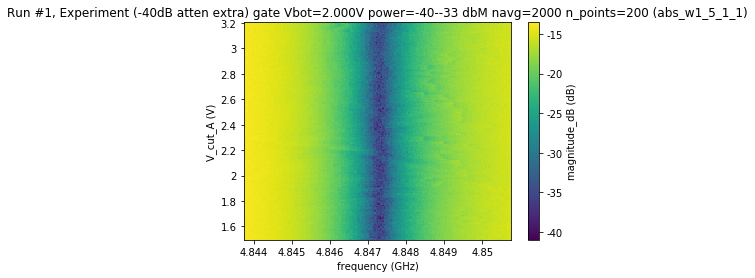

In [247]:
plot_by_id(1)

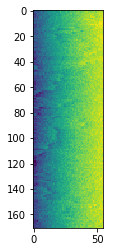

In [254]:
dat = unpack_data(1)

plt.imshow(dat['magnitude_dB'][:,145:] )

([<matplotlib.axes._subplots.AxesSubplot at 0x258335d25c0>,
  <matplotlib.colorbar.Colorbar at 0x25833881b70>])

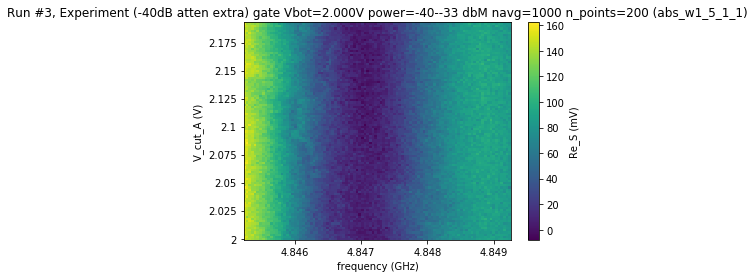

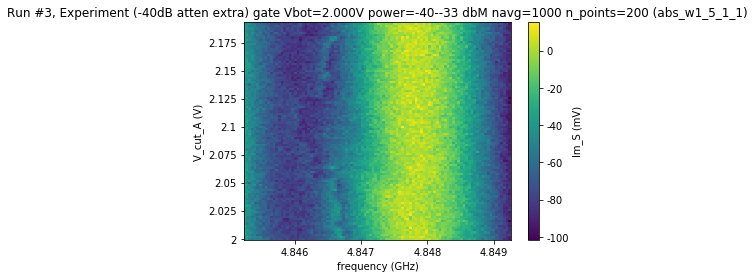

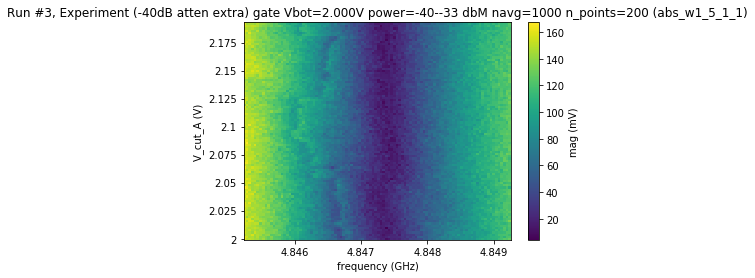

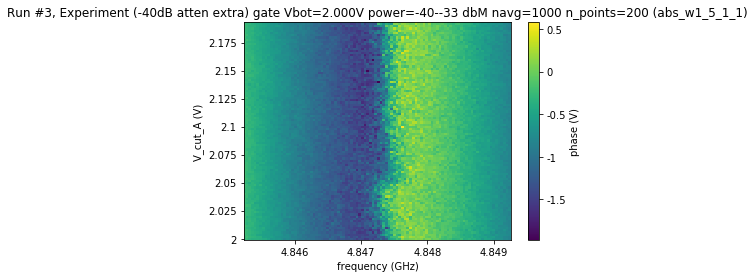

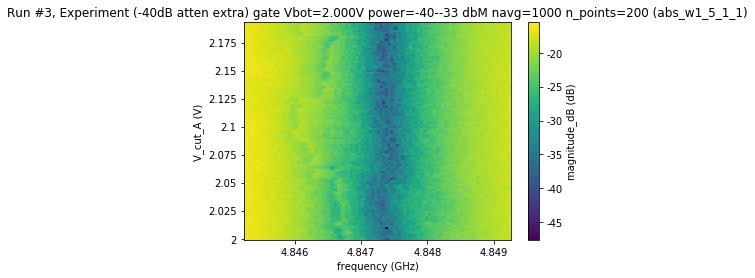

In [257]:
plot_by_id(3)

([<matplotlib.axes._subplots.AxesSubplot at 0x25841d208d0>,
  <matplotlib.colorbar.Colorbar at 0x25842040208>])

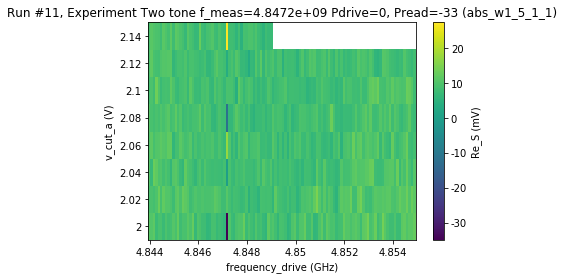

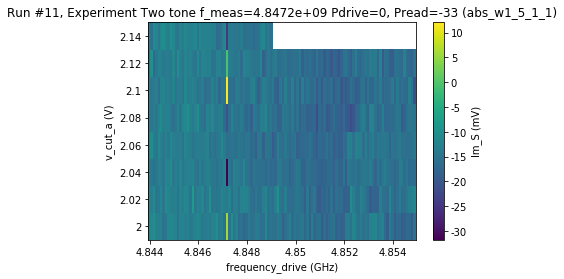

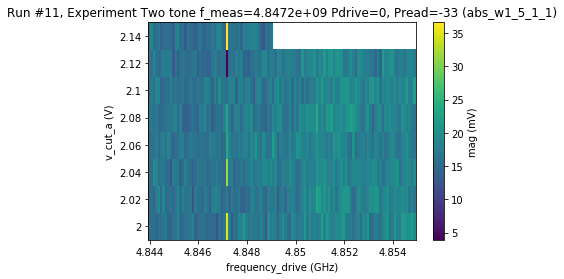

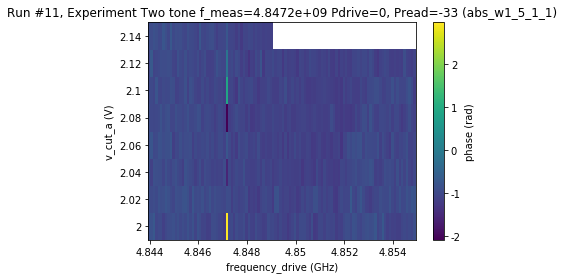

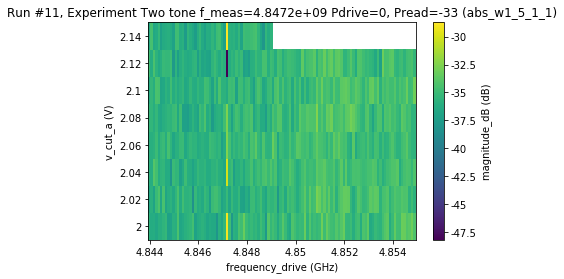

In [304]:
plot_by_id(11)

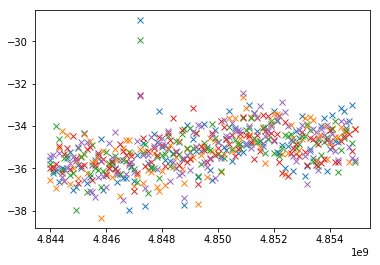

In [296]:
dat = unpack_data(11, col_names = ['frequency_drive', 'mag', 'phase', 'magnitude_dB'])
plt.plot(dat['frequency_drive'][0:109],dat['magnitude_dB'][0:109],'x')
plt.plot(dat['frequency_drive'][109:109*2],dat['magnitude_dB'][109:109*2],'x')
plt.plot(dat['frequency_drive'][109*2:109*3],dat['magnitude_dB'][109*2:109*3],'x')
plt.plot(dat['frequency_drive'][109*3:109*4],dat['magnitude_dB'][109*3:109*4],'x')
plt.plot(dat['frequency_drive'][109*4:109*5],dat['magnitude_dB'][109*4:109*5],'x')

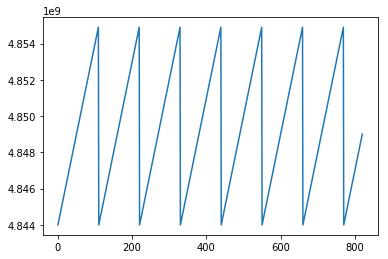

In [283]:
plt.plot(dat['frequency_drive'])

In [308]:
#initialize database
import datetime
date = '20190506'
dataset_name = 'ABS_W1_5_1_1'
qc.config["core"]["db_location"] = datetime.date.today().strftime(r'D:\OneDrive\BF3\Data\\'+date+'_'+dataset_name+'.db')
# automatically uses a different DB file for each month
qc.dataset.database.initialise_database()
qc.config.core.db_location


'D:\\OneDrive\\BF3\\Data\\\\20190506_ABS_W1_5_1_1.db'

([<matplotlib.axes._subplots.AxesSubplot at 0x2584498d358>,
 [None, None, None])

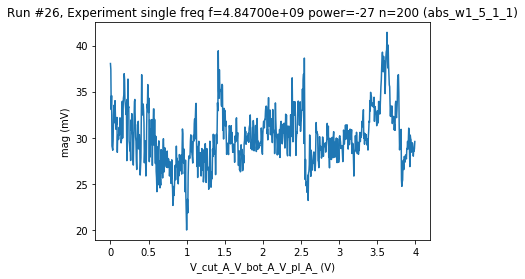

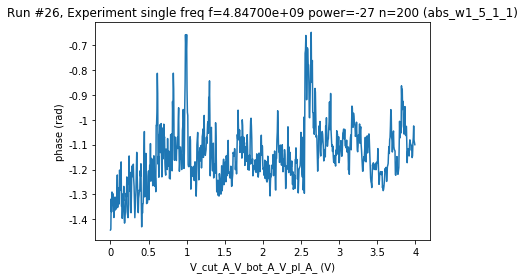

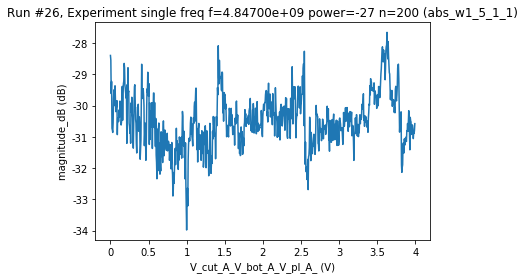

In [366]:
dat = load_by_id(26)
dat.get_data('V_cut_A_V_bot_A_V_pl_A_')

[[0],
 [0.005],
 [0.01],
 [0.015],
 [0.02],
 [0.025],
 [0.03],
 [0.035],
 [0.04],
 [0.045],
 [0.05],
 [0.055],
 [0.06],
 [0.065],
 [0.07],
 [0.075],
 [0.08],
 [0.085],
 [0.09],
 [0.095],
 [0.1],
 [0.105],
 [0.11],
 [0.115],
 [0.12],
 [0.125],
 [0.13],
 [0.135],
 [0.14],
 [0.145],
 [0.15],
 [0.155],
 [0.16],
 [0.165],
 [0.17],
 [0.175],
 [0.18],
 [0.185],
 [0.19],
 [0.195],
 [0.2],
 [0.205],
 [0.21],
 [0.215],
 [0.22],
 [0.225],
 [0.23],
 [0.235],
 [0.24],
 [0.245],
 [0.25],
 [0.255],
 [0.26],
 [0.265],
 [0.27],
 [0.275],
 [0.28],
 [0.285],
 [0.29],
 [0.295],
 [0.3],
 [0.305],
 [0.31],
 [0.315],
 [0.32],
 [0.325],
 [0.33],
 [0.335],
 [0.34],
 [0.345],
 [0.35],
 [0.355],
 [0.36],
 [0.365],
 [0.37],
 [0.375],
 [0.38],
 [0.385],
 [0.39],
 [0.395],
 [0.4],
 [0.405],
 [0.41],
 [0.415],
 [0.42],
 [0.425],
 [0.43],
 [0.435],
 [0.44],
 [0.445],
 [0.45],
 [0.455],
 [0.46],
 [0.465],
 [0.47],
 [0.475],
 [0.48],
 [0.485],
 [0.49],
 [0.495],
 [0.5],
 [0.505],
 [0.51],
 [0.515],
 [0.52],
 [0.525],
 

In [332]:
print(dat.run_timestamp()

'2019-05-06 19:40:20'

In [639]:
plot_by_id(28|)

SyntaxError: invalid syntax (<ipython-input-639-103ee42134e9>, line 1)

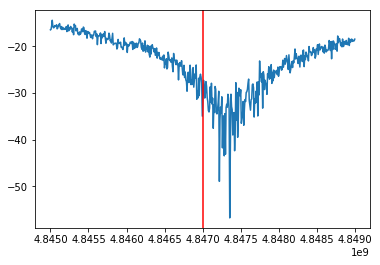

In [337]:
dat = unpack_data(29, col_names=['frequency', 'phase', 'magnitude_dB'])
plt.figure()
plt.plot(dat['frequency'],dat['magnitude_dB'])
plt.axvline(x=4.84700e9,color='r')

([<matplotlib.axes._subplots.AxesSubplot at 0x2584d324ba8>,
 [None, None, None])

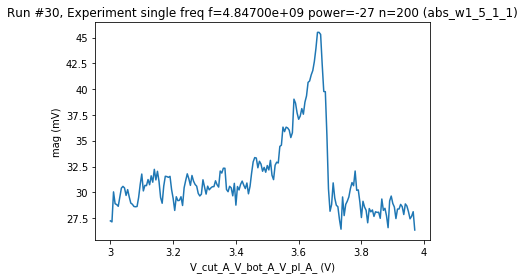

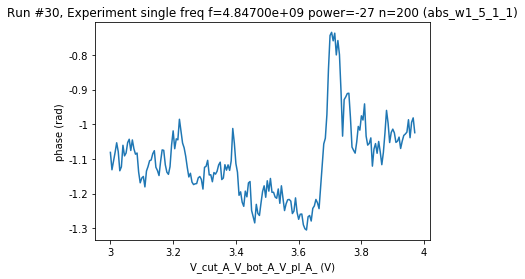

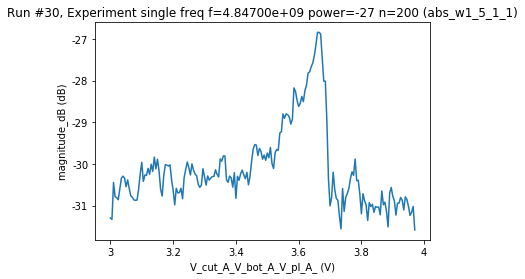

In [370]:
plot_by_id(30)

([<matplotlib.axes._subplots.AxesSubplot at 0x258551b8b70>,
 [None, None, None])

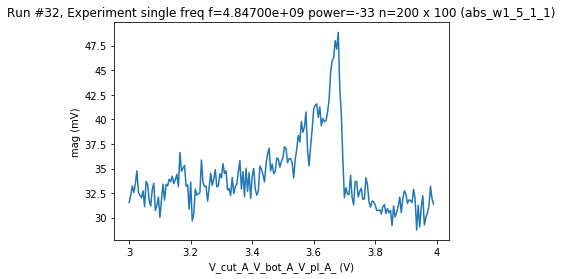

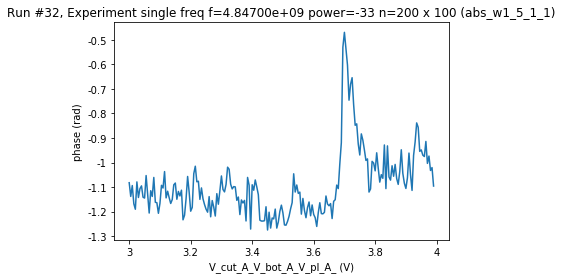

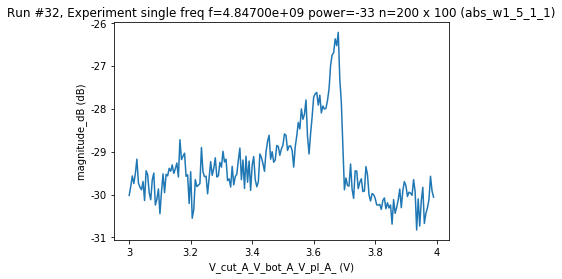

In [398]:
plot_by_id(32)

([<matplotlib.axes._subplots.AxesSubplot at 0x2586e029e80>,
 [None, None, None])

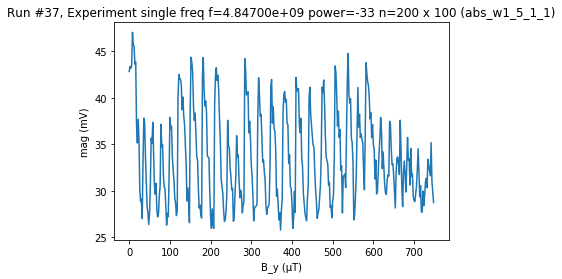

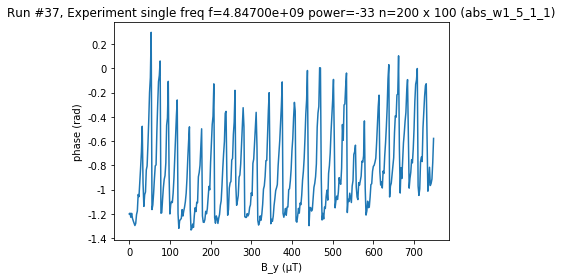

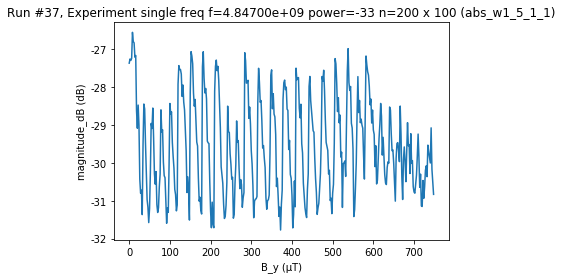

In [523]:
plot_by_id(37)

In [209]:
data = unpack_data(37, col_names = ['B_y', 'mag', 'phase'])

plt.figure(figsize=(15,4))
plt.plot( np.fft.fftfreq(len(data['mag']), d=(data['B_y'][1]-data['B_y'][0])),np.abs(np.fft.fft(data['mag'])))
plt.ylim((0,2))
#plt.xlim(0,150e-6)

ValueError: Run with run_id 37 does not exist in the database

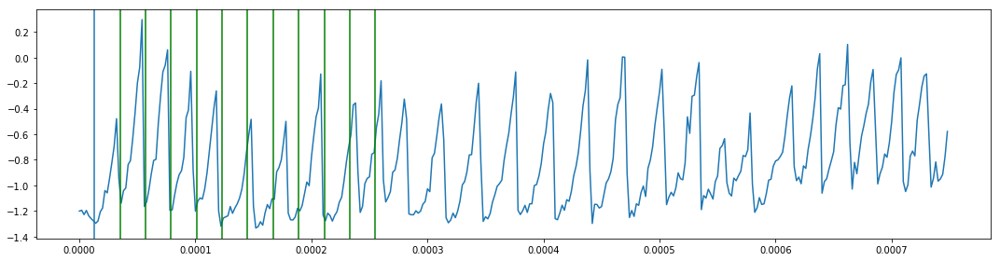

In [609]:
plt.figure(figsize=(15,4))
plt.plot(data['B_y'][0:400],data['phase'][0:400])
plt.tight_layout()
offset = 13e-6
plt.axvline(x=offset)
period = 22e-6
for i in range(1,12):
    plt.axvline(x=offset+i*period, color='g')


        

([<matplotlib.axes._subplots.AxesSubplot at 0x2586f1c4320>,
 [None, None, None])

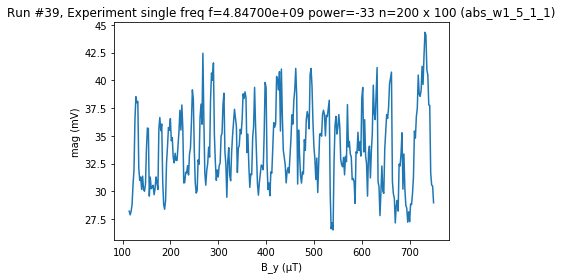

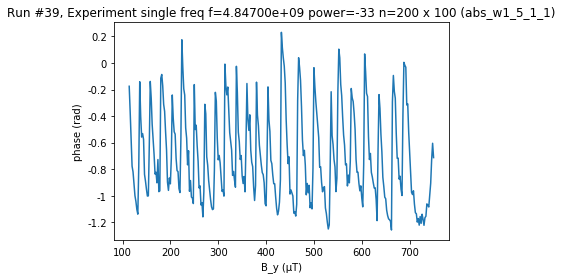

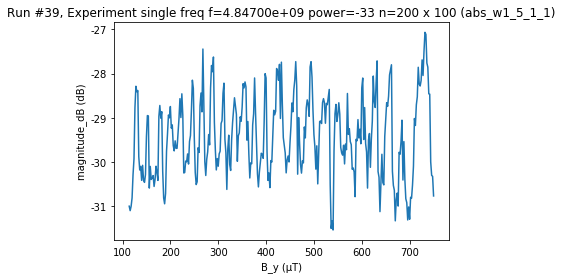

In [524]:
plot_by_id(39)

([<matplotlib.axes._subplots.AxesSubplot at 0x2586a3b7f28>,
 [None, None, None])

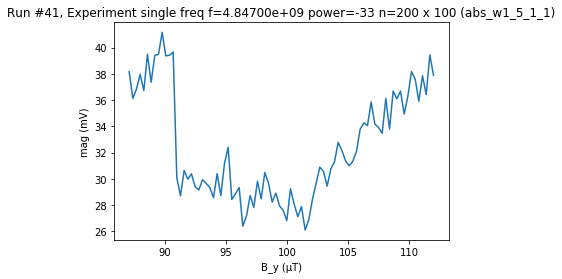

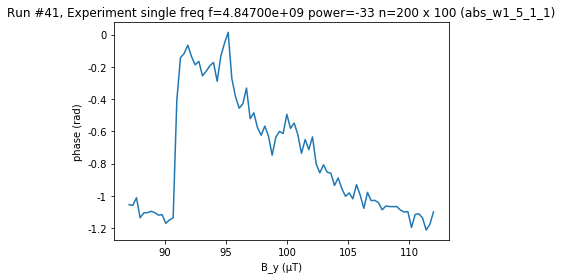

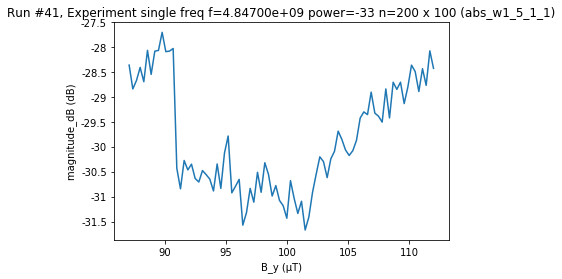

In [568]:
plot_by_id(41)

([<matplotlib.axes._subplots.AxesSubplot at 0x2588c464978>,
 [None, None, None])

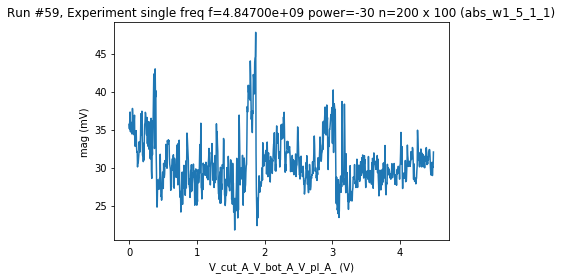

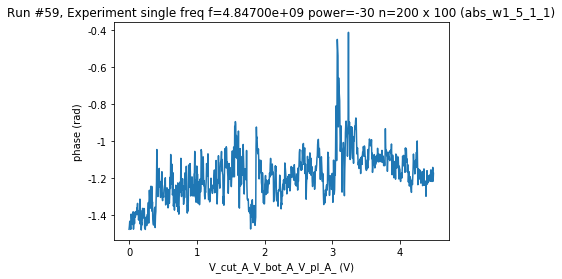

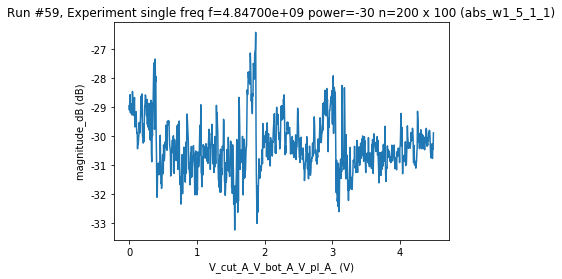

In [650]:
plot_by_id(59)

([<matplotlib.axes._subplots.AxesSubplot at 0x2587f73f1d0>,
 [None, None, None])

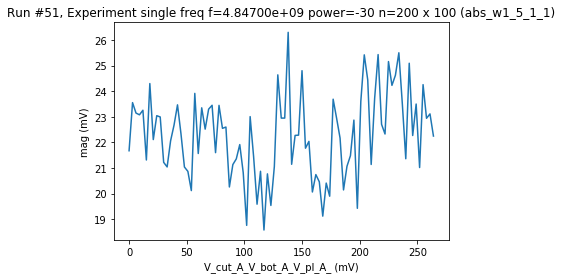

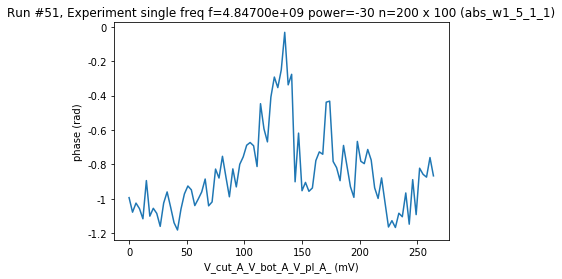

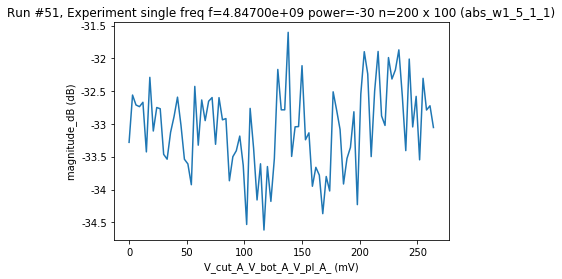

In [605]:
plot_by_id(51)

([<matplotlib.axes._subplots.AxesSubplot at 0x2588b08e630>,
 [None, None, None])

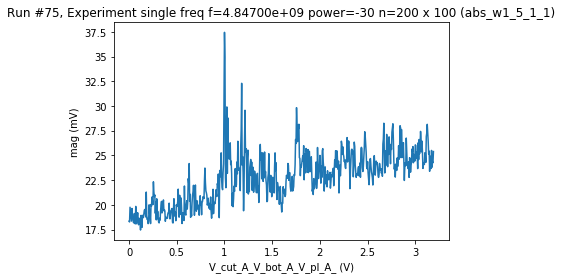

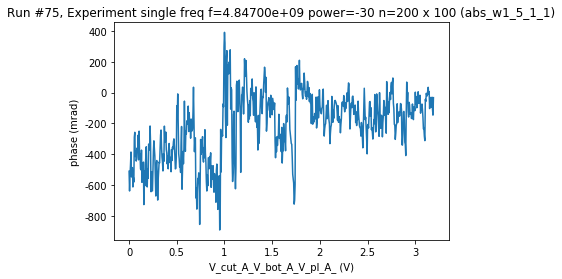

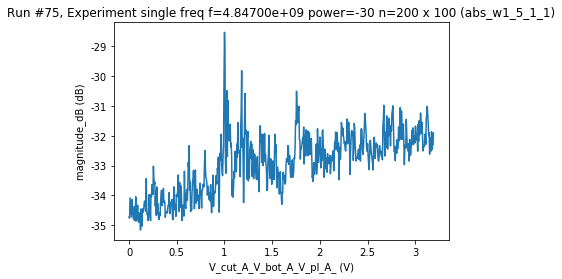

In [647]:
plot_by_id(75)

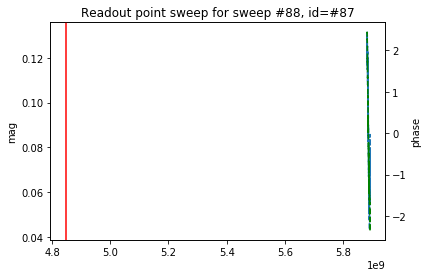

In [703]:
plot_readout_point_from_sweep(87)

([<matplotlib.axes._subplots.AxesSubplot at 0x25882169b70>,
 [None, None, None])

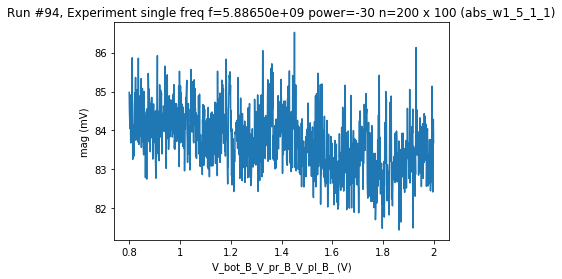

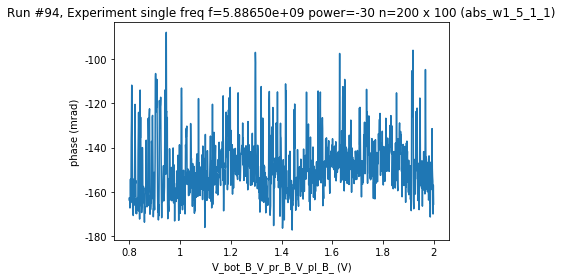

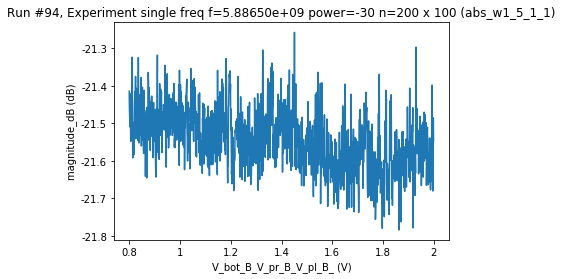

In [723]:
plot_by_id(94)

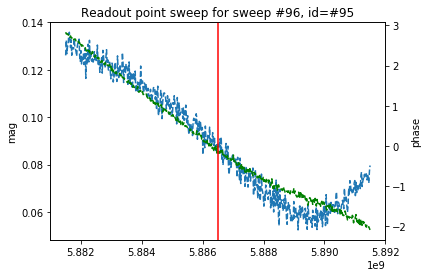

In [760]:
plot_readout_point_from_sweep(95, f_readout=5.8865e9)

In [810]:
dat1 = unpack_data(96, col_names=['V_bot_B_V_pr_B_V_pl_B_', 'mag', 'phase'])

Text(0,0.5,'mag')

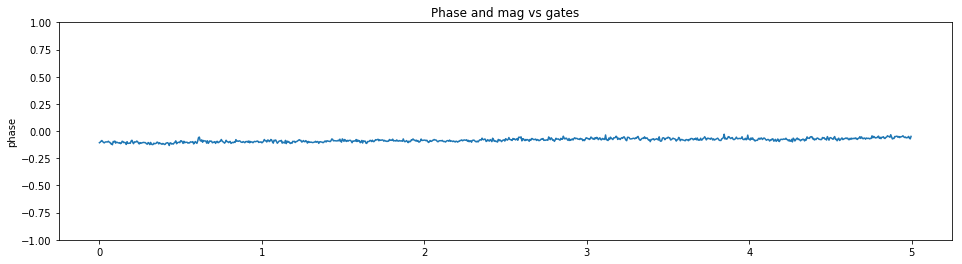

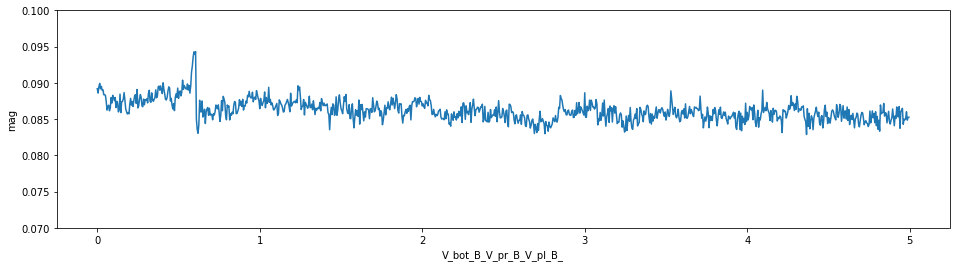

In [813]:
dat = dat1
plt.figure(figsize=(16,4))
plt.plot(dat['V_bot_B_V_pr_B_V_pl_B_'], dat['phase'])
plt.ylim((-1,1))
plt.ylabel('phase')
plt.title('Phase and mag vs gates')
plt.figure(figsize=(16,4))
plt.plot(dat['V_bot_B_V_pr_B_V_pl_B_'], dat['mag'])
plt.ylim((0.07,0.10))
plt.xlabel('V_bot_B_V_pr_B_V_pl_B_')
plt.ylabel('mag')


([<matplotlib.axes._subplots.AxesSubplot at 0x2589c78f668>,
 [None, None, None])

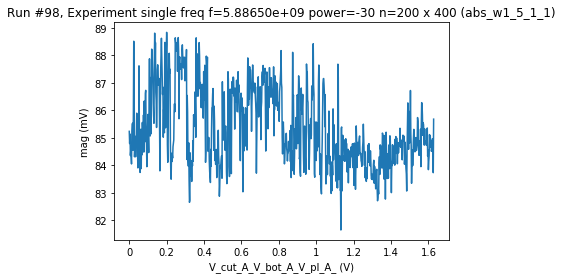

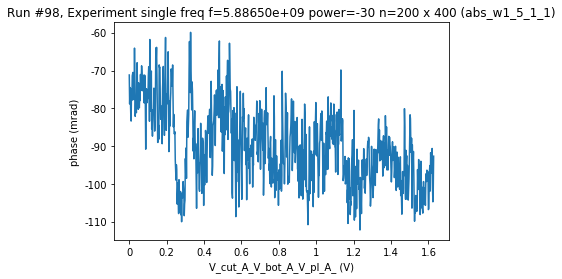

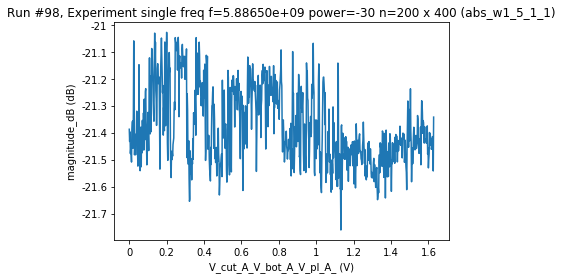

In [763]:
plot_by_id(98)

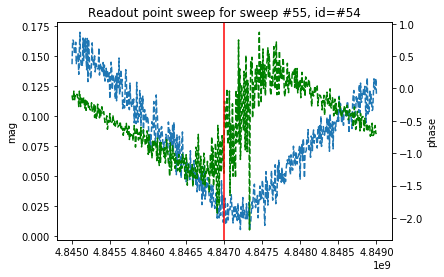

In [822]:
plot_readout_point_from_sweep(54)

Text(0,0.5,'mag')

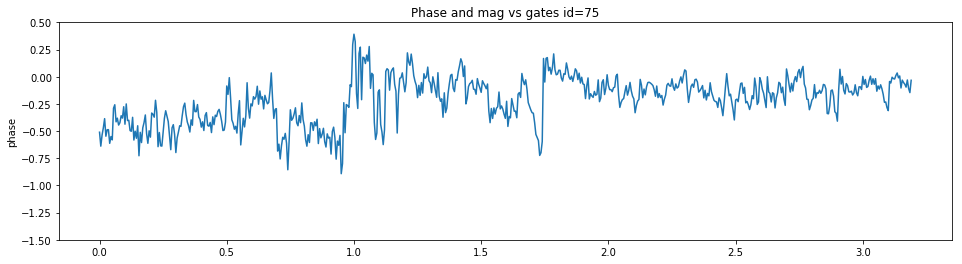

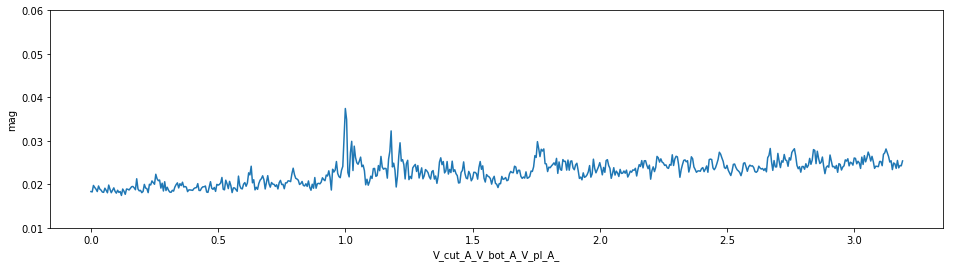

In [831]:
meas_id=75
dat1 = unpack_data(meas_id, col_names=['V_cut_A_V_bot_A_V_pl_A_', 'mag', 'phase'])
dat = dat1

plt.figure(figsize=(16,4))
plt.plot(dat['V_cut_A_V_bot_A_V_pl_A_'], dat['phase'])
plt.ylim((-1.5,0.5))
plt.ylabel('phase')
plt.title('Phase and mag vs gates id=%d' % meas_id)
plt.figure(figsize=(16,4))
plt.plot(dat['V_cut_A_V_bot_A_V_pl_A_'], dat['mag'])

plt.ylim((0.01,0.06))

plt.xlabel('V_cut_A_V_bot_A_V_pl_A_')
plt.ylabel('mag')


## New heading

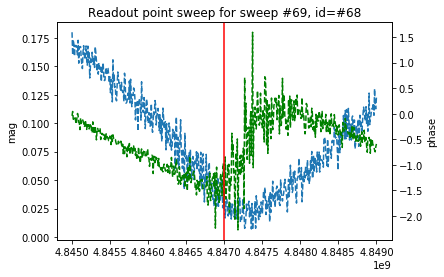

In [778]:
plot_readout_point_from_sweep(68)

([<matplotlib.axes._subplots.AxesSubplot at 0x258a0776550>,
  <matplotlib.colorbar.Colorbar at 0x258a06ec898>])

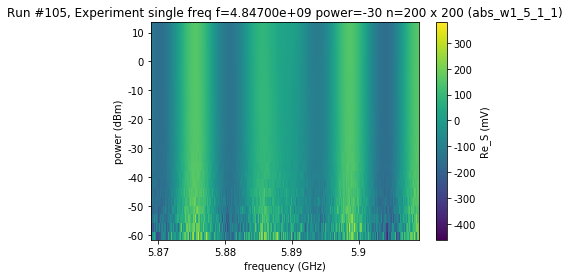

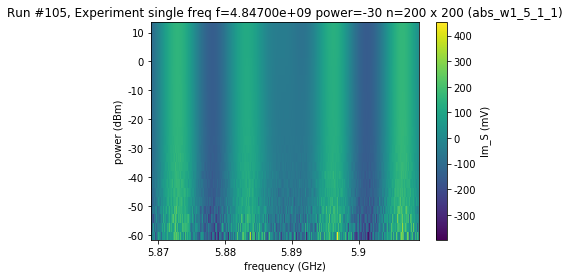

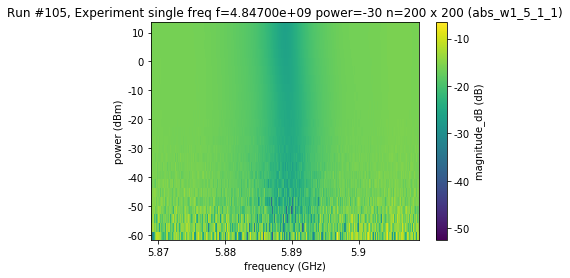

In [800]:
plot_by_id(105)

([<matplotlib.axes._subplots.AxesSubplot at 0x258b1b0af60>,
  <matplotlib.colorbar.Colorbar at 0x258b454b4e0>])

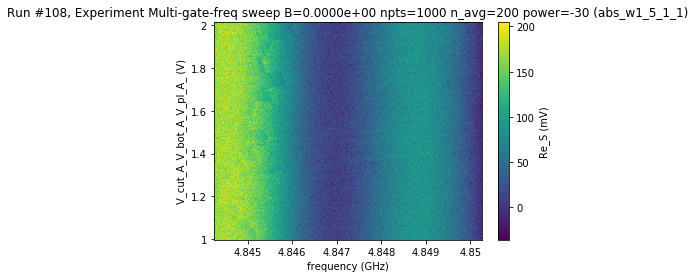

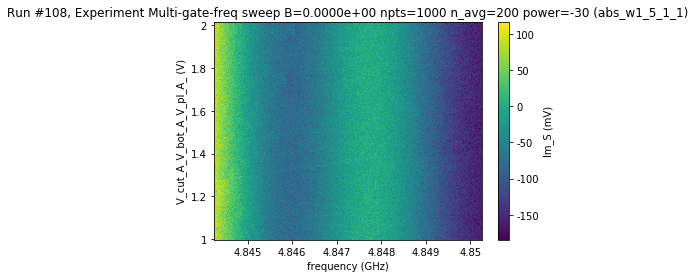

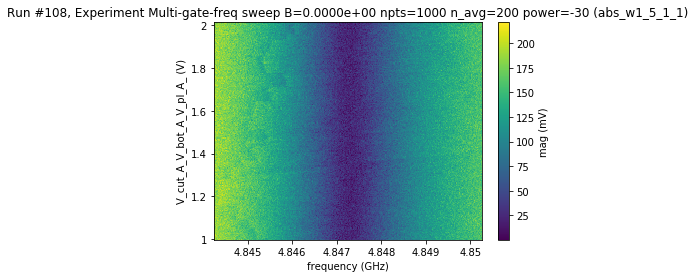

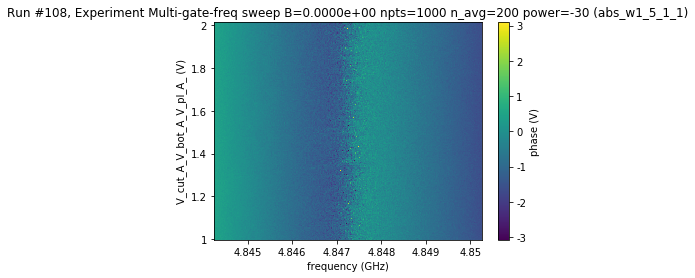

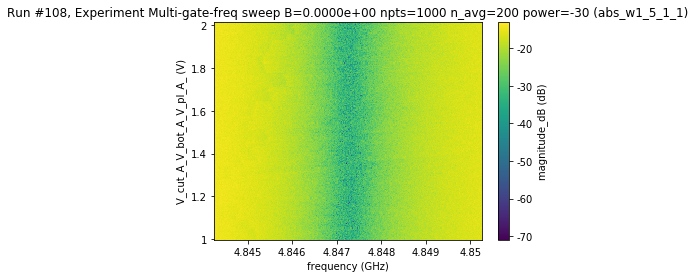

In [833]:
plot_by_id(108)

In [12]:
#initialize database
import datetime
date = '20190509'
dataset_name = 'ABS_W1_5_1_1'
qc.config["core"]["db_location"] = datetime.date.today().strftime(r'D:\OneDrive\BF3\Data\\'+date+'_'+dataset_name+'.db')
# automatically uses a different DB file for each month
qc.dataset.database.initialise_database()
qc.config.core.db_location
%matplotlib inline

([<matplotlib.axes._subplots.AxesSubplot at 0x2d3a307e358>,
  <matplotlib.colorbar.Colorbar at 0x2d3a87260f0>])

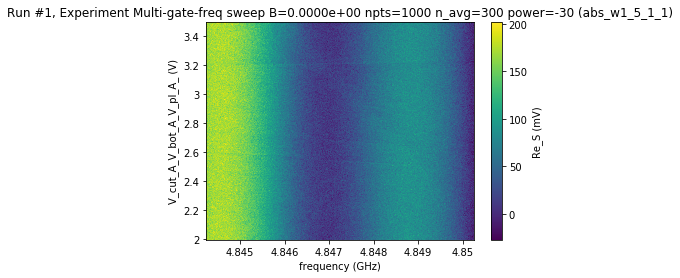

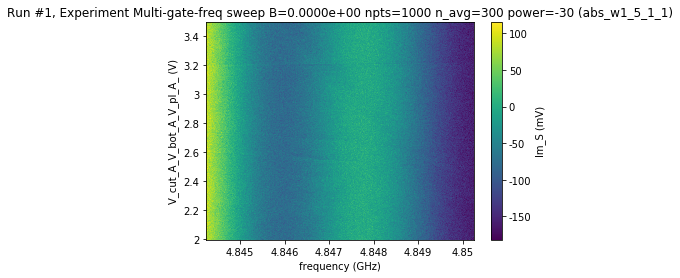

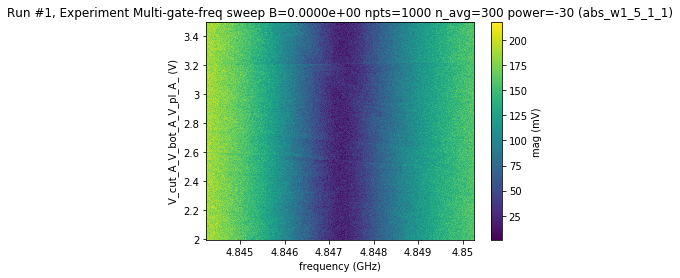

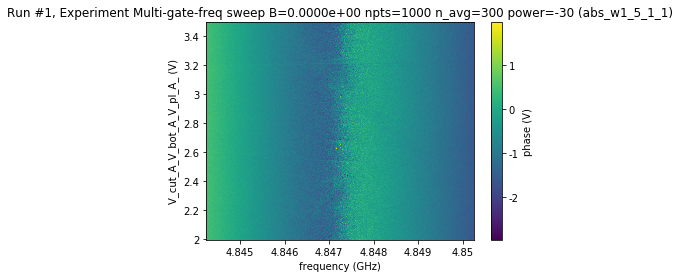

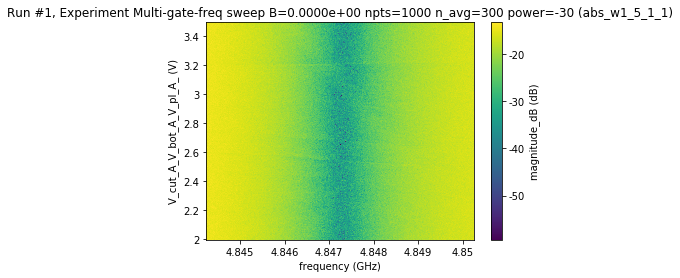

In [14]:
plot_by_id(1)

([<matplotlib.axes._subplots.AxesSubplot at 0x2d3ad779d68>,
 [None, None, None])

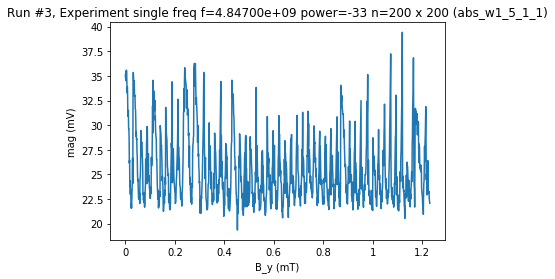

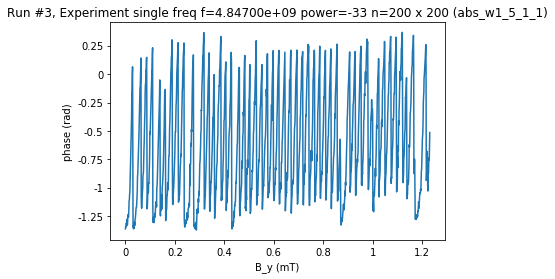

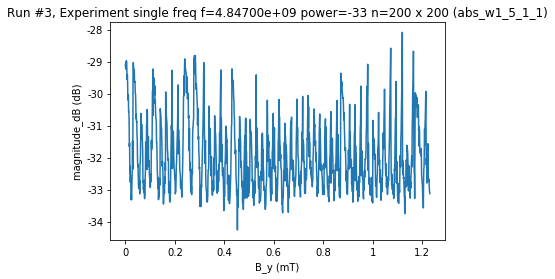

In [31]:
plot_by_id(3)

<IPython.core.display.Javascript object>


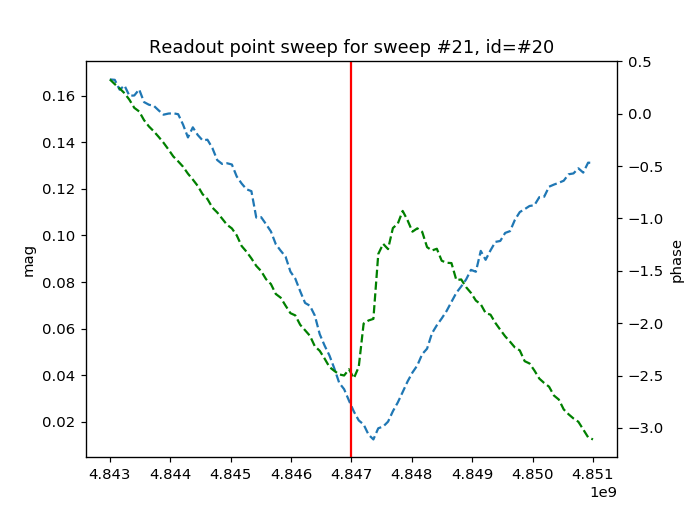

In [129]:
plot_readout_point_from_sweep(20, f_readout=4.847e9)

([<matplotlib.axes._subplots.AxesSubplot at 0x2d3b80eab70>,
 [None, None, None])

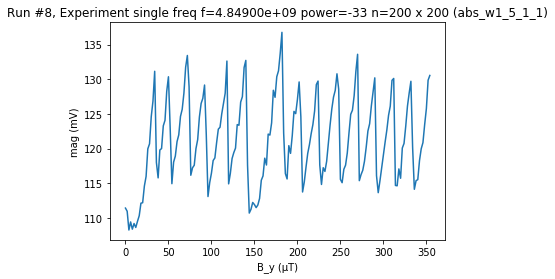

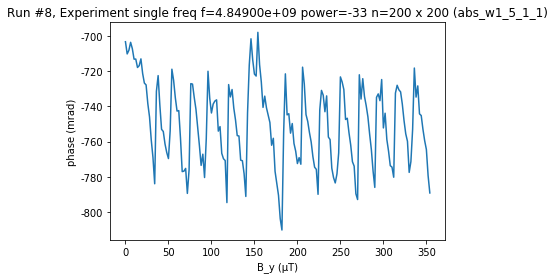

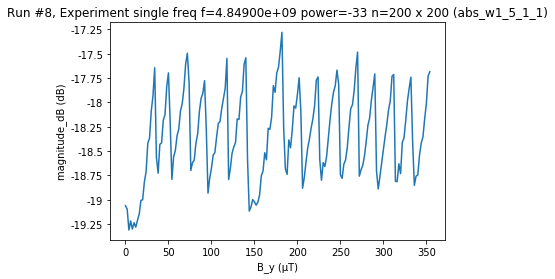

In [85]:
plot_by_id(8)

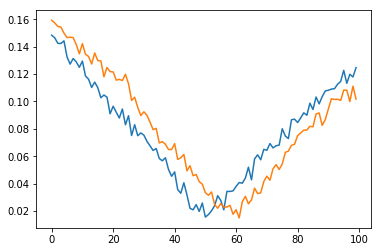

In [69]:
dat1 = load_by_id(4)
dat2 = load_by_id(2)
plt.plot(np.squeeze(dat1.get_data('magnitude_raw')))
plt.plot(np.squeeze(dat2.get_data('magnitude_raw')))

In [62]:
load_by_id(8)

results #8@D:\OneDrive\BF3\Data\\20190509_ABS_W1_5_1_1.db
---------------------------------------------------------
temperature - numeric
frequency_readout - numeric
B_y - numeric
power - numeric
n_pts - numeric
mag - numeric
phase - numeric
magnitude_dB - numeric

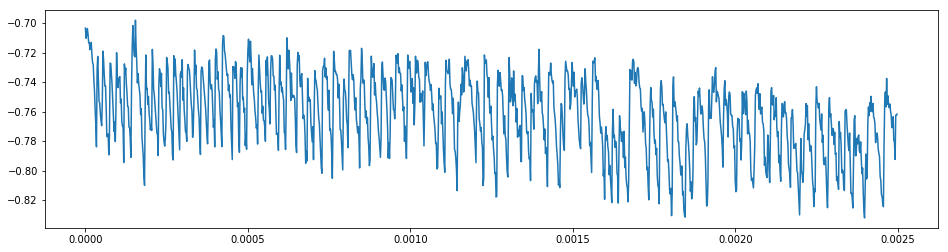

In [102]:
dat = load_by_id(8)
Bs = np.squeeze(dat.get_data('B_y'))
mag = np.squeeze(dat.get_data('phase'))
plt.figure(figsize=(16,4))
plt.plot(Bs, mag)

Text(0.5,0,'B_y (T)')

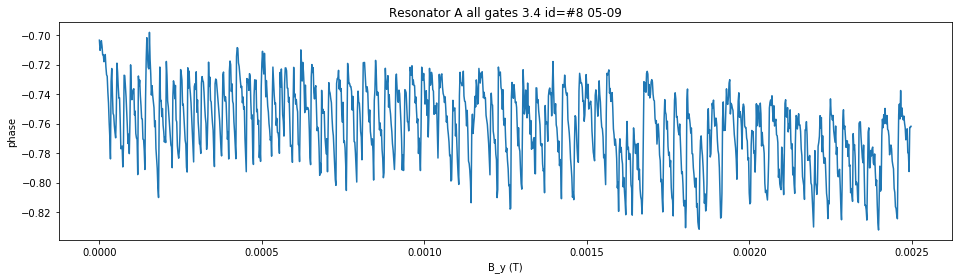

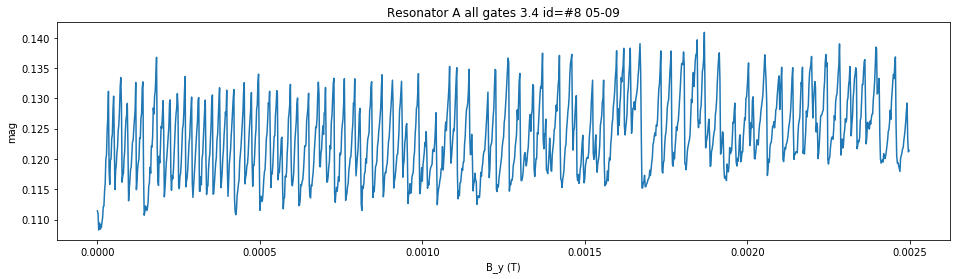

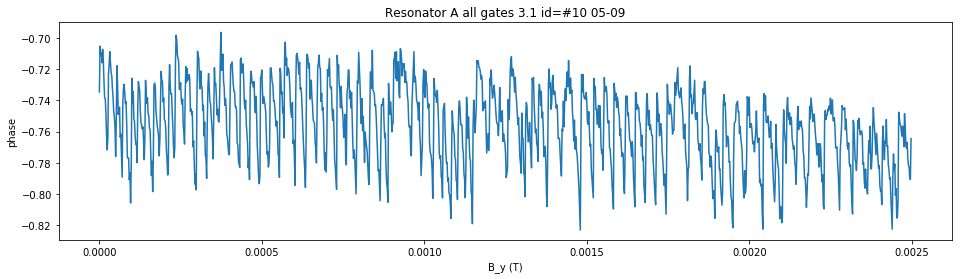

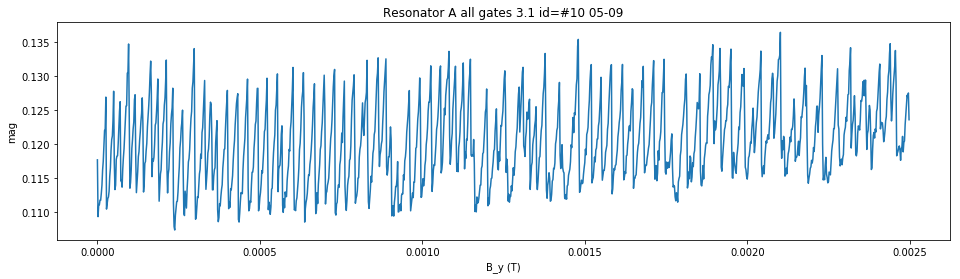

In [118]:
dat = load_by_id(8)
Bs = np.squeeze(dat.get_data('B_y'))
mag = np.squeeze(dat.get_data('phase'))
plt.figure(figsize=(16,4))
plt.plot(Bs, mag)
plt.title('Resonator A all gates 3.4 id=#8 05-09')
plt.ylabel('phase')
plt.xlabel('B_y (T)')

Bs = np.squeeze(dat.get_data('B_y'))
mag = np.squeeze(dat.get_data('mag'))
plt.figure(figsize=(16,4))
plt.plot(Bs, mag)
plt.title('Resonator A all gates 3.4 id=#8 05-09')
plt.ylabel('mag')
plt.xlabel('B_y (T)')


dat = load_by_id(10)
Bs = np.squeeze(dat.get_data('B_y'))
mag = np.squeeze(dat.get_data('phase'))
plt.figure(figsize=(16,4))
plt.plot(Bs, mag)
plt.title('Resonator A all gates 3.1 id=#10 05-09')
plt.ylabel('phase')
plt.xlabel('B_y (T)')


Bs = np.squeeze(dat.get_data('B_y'))
mag = np.squeeze(dat.get_data('mag'))
plt.figure(figsize=(16,4))
plt.plot(Bs, mag)
plt.title('Resonator A all gates 3.1 id=#10 05-09')
plt.ylabel('mag')
plt.xlabel('B_y (T)')


Text(0.5,0,'B_y (T)')

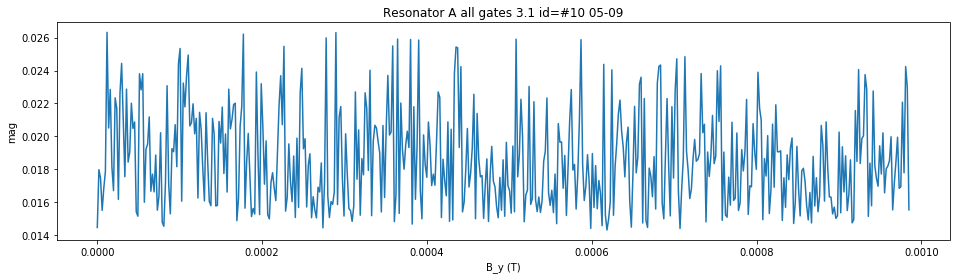

In [208]:
%matplotlib inline
dat = load_by_id(32)
Bs = np.squeeze(dat.get_data('B_y'))
mag = np.squeeze(dat.get_data('mag'))
plt.figure(figsize=(16,4))
plt.plot(Bs, mag)
plt.title('Resonator A all gates 3.1 id=#32 05-09')
plt.ylabel('mag')
plt.xlabel('B_y (T)')

<IPython.core.display.Javascript object>


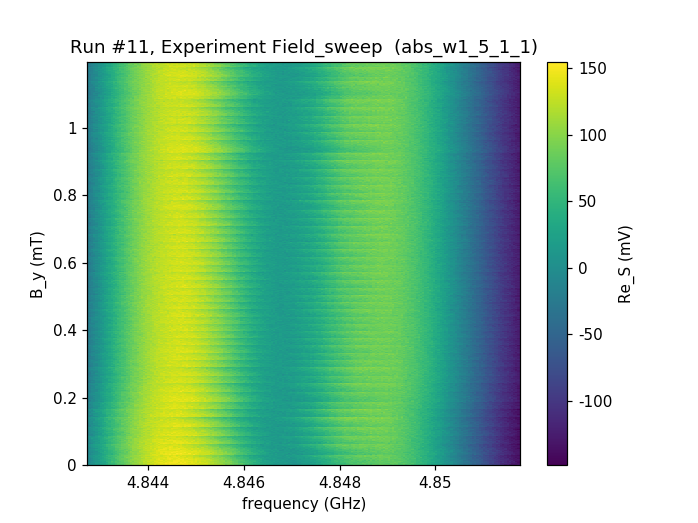

<IPython.core.display.Javascript object>


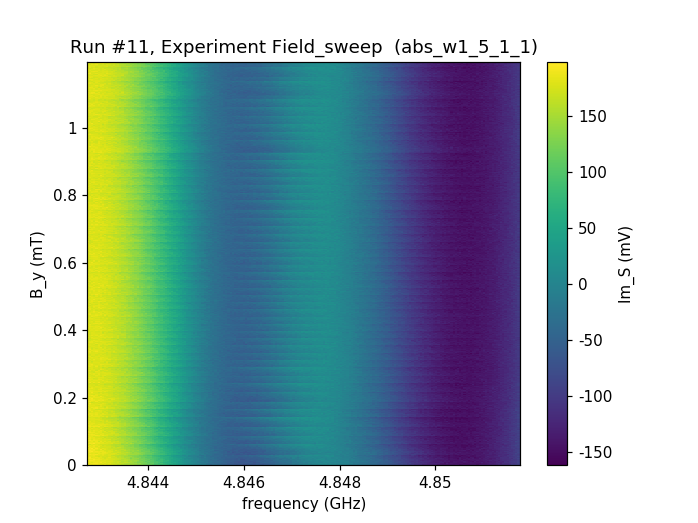

<IPython.core.display.Javascript object>


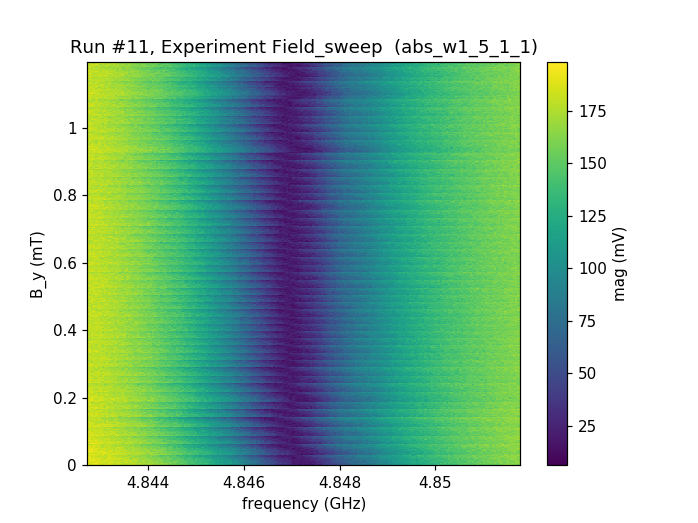

<IPython.core.display.Javascript object>


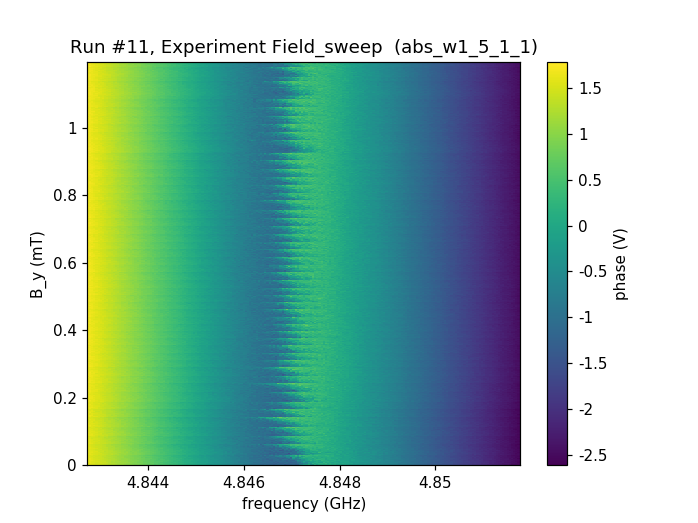

<IPython.core.display.Javascript object>


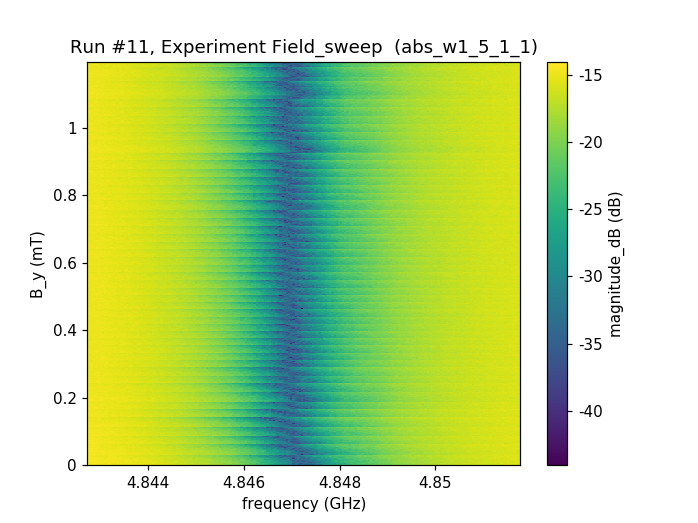

([<matplotlib.axes._subplots.AxesSubplot at 0x2d3bdf5c6d8>,
  <matplotlib.colorbar.Colorbar at 0x2d3bf330eb8>])

In [122]:
plot_by_id(11)

In [120]:
%matplotlib nbagg

plot_by_id(15)

<IPython.core.display.Javascript object>


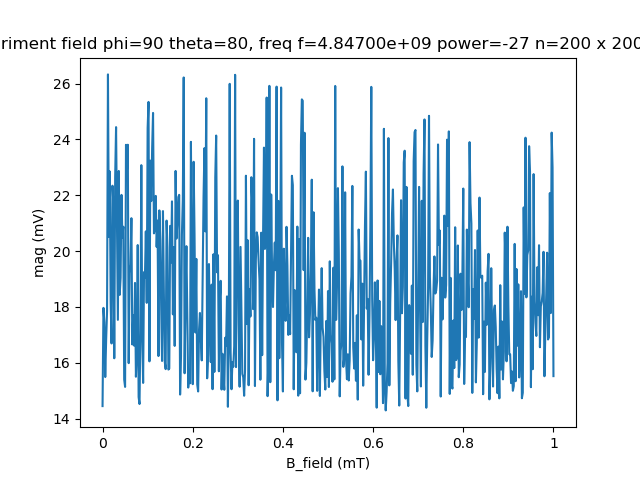

<IPython.core.display.Javascript object>


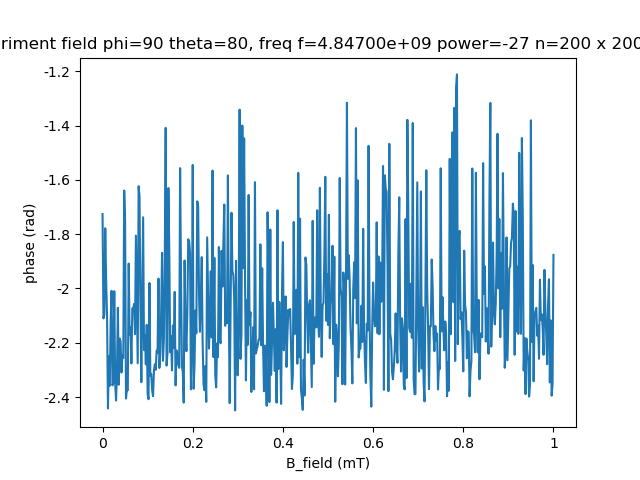

<IPython.core.display.Javascript object>


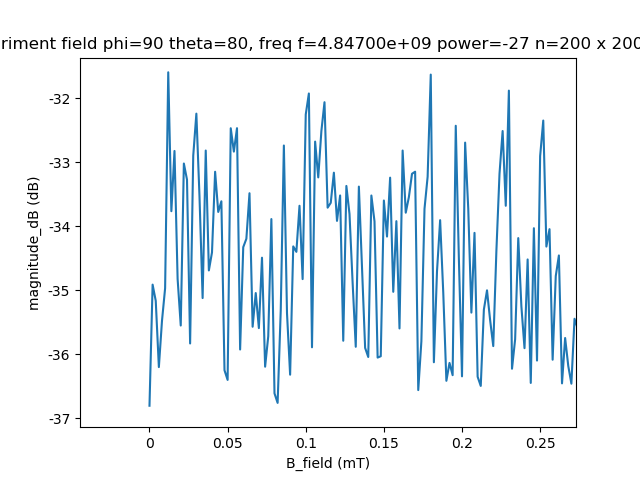

([<matplotlib.axes._subplots.AxesSubplot at 0x2d4451e8a20>,
 [None, None, None])

In [205]:
plot_by_id(32)

In [ ]:
logfile_name = 'CH5 T'
days_in_the_past = 15
ts = datetime.datetime.today() - datetime.timedelta(days=days_in_the_past)
ds = '%02d-%02d-%02d'%(ts.year-2000, ts.month, ts.day) 
pth = BF_PC_PATH + ds + '\\' + logfile_name+ ' ' + ds+'.log'

T = np.loadtxt(pth, usecols = (2), delimiter = ',')
plt.figure()
plt.plot(T)
plt.title(ds + ' ' + pth)

logfile_name = 'CH9 T'
ts = datetime.datetime.today() - datetime.timedelta(days=days_in_the_past)
ds = '%02d-%02d-%02d'%(ts.year-2000, ts.month, ts.day) 
pth = BF_PC_PATH + ds + '\\' + logfile_name+ ' ' + ds+'.log'

T = np.loadtxt(pth, usecols = (2), delimiter = ',')
plt.figure()
plt.plot(T)
plt.title(pth)